# Jobathon Nov 2022 Time series EDA


## Table of Contents
### 1. [Loading and cleaning dataframe](#loading)
### 2. [Exploratory data analysis](#eda)
### 3. [Decompositon of time series to individual components](#decompose)
### 4. [ACF and PACF Plots](#acf)

In [1]:
#mathematical operations
import numpy as np

#data handling
import pandas as pd

#plotting
import matplotlib as mpl
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf


#machine learning and statistical methods
import statsmodels.api as sm

#dataframe index manipulations
import datetime

#muting unnecessary warnings if needed
import warnings

<a id='loading'></a>
## 1. Loading and cleaning dataframe

In [2]:
#loading train data
train = pd.read_csv("train.csv", index_col=1)
train.head()

,row_id,energy
datetime,,
2008-03-01 00:00:00,1,1259.985563
2008-03-01 01:00:00,2,1095.541500
2008-03-01 02:00:00,3,1056.247500
2008-03-01 03:00:00,4,1034.742000
2008-03-01 04:00:00,5,1026.334500


In [3]:
train.drop('row_id',inplace=True,axis=1)

In [4]:
#sorting unordered indices
train.sort_index(inplace = True)
train

,energy
datetime,
2008-03-01 00:00:00,1259.985563
2008-03-01 01:00:00,1095.541500
2008-03-01 02:00:00,1056.247500
2008-03-01 03:00:00,1034.742000
2008-03-01 04:00:00,1026.334500
...,...
2018-12-31 19:00:00,2528.446800
2018-12-31 20:00:00,2461.883600
2018-12-31 21:00:00,2365.994400


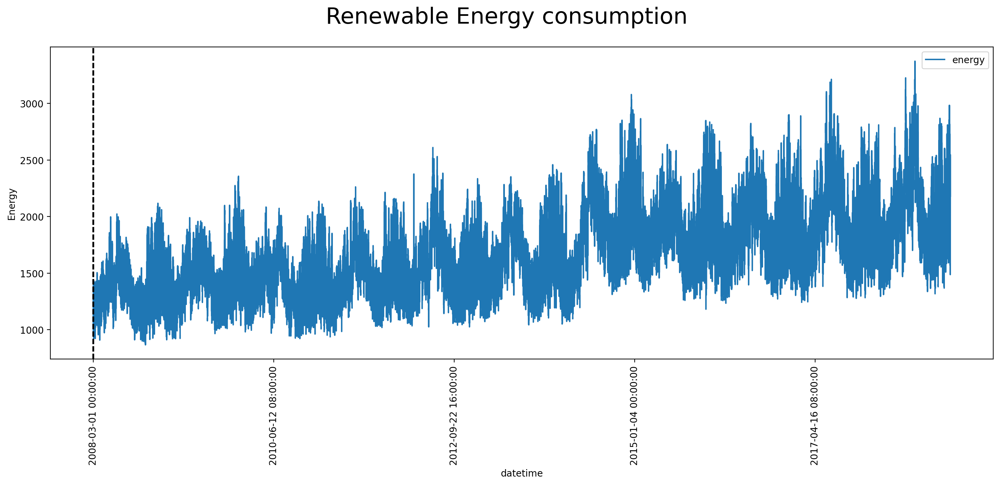

In [5]:
#visual checking of data. Plotting by Pandas method, drawing axes by Matplotlib
f, ax = plt.subplots(figsize=(18,6),dpi=200);
plt.suptitle('Renewable Energy consumption', fontsize=24);
train.plot(ax=ax,rot=90,ylabel='Energy');
xcoords = ['2008-01-01','2009-01-01','2010-01-01', '2011-01-01', '2012-01-01', '2013-01-01', '2014-01-01',
           '2015-01-01', '2016-01-01', '2017-01-01', '2018-01-01', '2019-01-01']
for xc in xcoords:
    plt.axvline(x=xc, color='black', linestyle='--')

In [6]:
#creating datetime list with boundaries of raw data series, hourly frequency
datelist = pd.date_range(datetime.datetime(2008,3,1,0,0,0), datetime.datetime(2018,12,31,23,0,0), freq='H').tolist()

#extracting raw data series indices
idx_list = train.index.to_list()

#checking for anomalies by comparing the two
len(idx_list) == len(datelist)

True

In [7]:
#searching for anomalies
len(datelist), len(idx_list), len(set(idx_list))

(94992, 94992, 94992)

In [8]:
#converting dataframe indices to datetime
index_dt = pd.to_datetime(train.index, format='%Y-%m-%d %H:%M:%S')

In [9]:
#changing string indices to datetime converted indices
train.set_index(index_dt, inplace=True)
train.index

DatetimeIndex(['2008-03-01 00:00:00', '2008-03-01 01:00:00',
               '2008-03-01 02:00:00', '2008-03-01 03:00:00',
               '2008-03-01 04:00:00', '2008-03-01 05:00:00',
               '2008-03-01 06:00:00', '2008-03-01 07:00:00',
               '2008-03-01 08:00:00', '2008-03-01 09:00:00',
               ...
               '2018-12-31 14:00:00', '2018-12-31 15:00:00',
               '2018-12-31 16:00:00', '2018-12-31 17:00:00',
               '2018-12-31 18:00:00', '2018-12-31 19:00:00',
               '2018-12-31 20:00:00', '2018-12-31 21:00:00',
               '2018-12-31 22:00:00', '2018-12-31 23:00:00'],
              dtype='datetime64[ns]', name='datetime', length=94992, freq=None)

In [10]:
train.sort_index(inplace=True)
train

,energy
datetime,
2008-03-01 00:00:00,1259.985563
2008-03-01 01:00:00,1095.541500
2008-03-01 02:00:00,1056.247500
2008-03-01 03:00:00,1034.742000
2008-03-01 04:00:00,1026.334500
...,...
2018-12-31 19:00:00,2528.446800
2018-12-31 20:00:00,2461.883600
2018-12-31 21:00:00,2365.994400


In [11]:
#setting frequency attribute of datetime index
train.index.freq = 'H'
train.index

DatetimeIndex(['2008-03-01 00:00:00', '2008-03-01 01:00:00',
               '2008-03-01 02:00:00', '2008-03-01 03:00:00',
               '2008-03-01 04:00:00', '2008-03-01 05:00:00',
               '2008-03-01 06:00:00', '2008-03-01 07:00:00',
               '2008-03-01 08:00:00', '2008-03-01 09:00:00',
               ...
               '2018-12-31 14:00:00', '2018-12-31 15:00:00',
               '2018-12-31 16:00:00', '2018-12-31 17:00:00',
               '2018-12-31 18:00:00', '2018-12-31 19:00:00',
               '2018-12-31 20:00:00', '2018-12-31 21:00:00',
               '2018-12-31 22:00:00', '2018-12-31 23:00:00'],
              dtype='datetime64[ns]', name='datetime', length=94992, freq='H')

<a id='eda'></a>
## 2. Exploratory data analysis

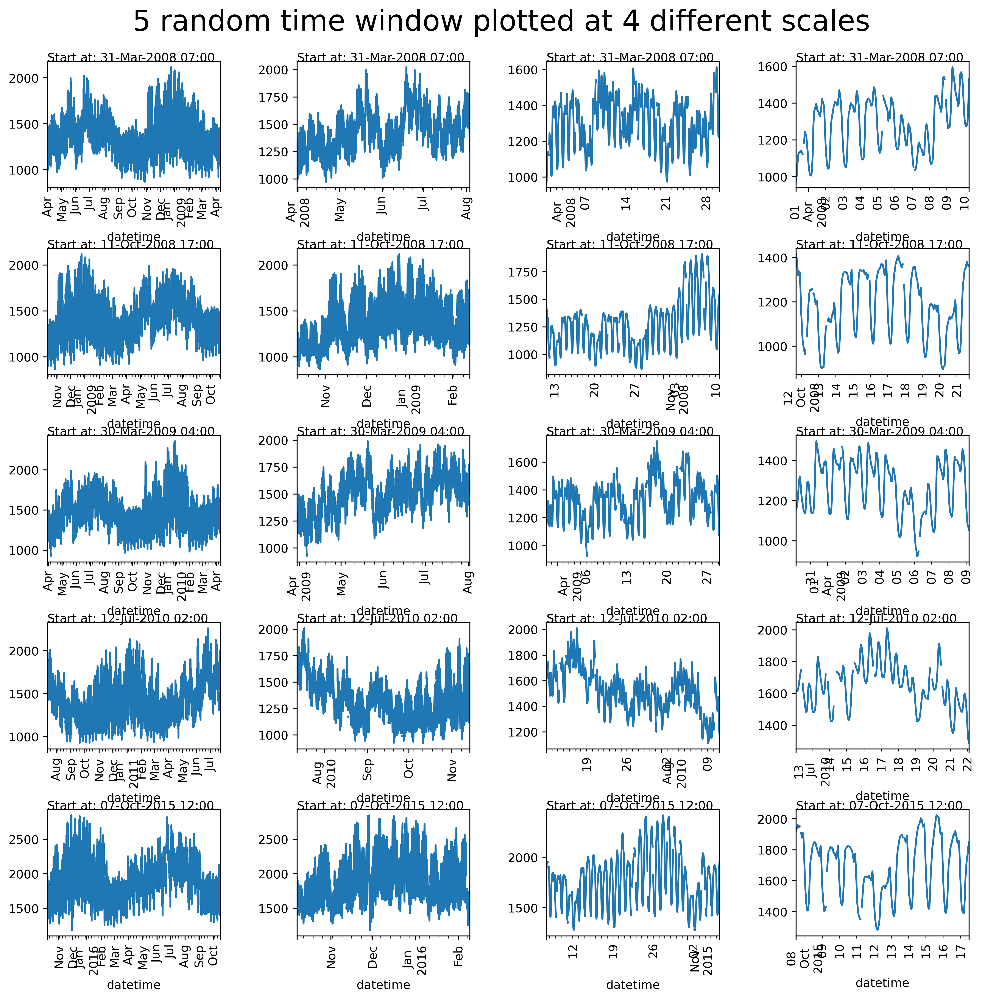

In [12]:
#drawing a random sample of 5 indices without repetition
sample = sorted([x for x in np.random.choice(range(len(train)), 5, replace=False)])

#zoom x scales for plotting
periods = [9000,3000,720,240]

#plotting random time intervals at different scales to observe any seasonality present
f, axes = plt.subplots(len(sample),4,dpi=400,figsize=(12,12));
plt.suptitle('{} random time window plotted at {} different scales'.format(len(sample),len(periods)), fontsize=24, x=0.5, y=0.95)
f.tight_layout(pad=3.0);

#s for sample datetime start
for si,s in enumerate(sample):
    
    #p for period length
    for pi,p in enumerate(periods):
        train.iloc[s:(s+p+1),:].plot(ax=axes[si][pi], legend=False, rot=90);
        #annotating datetime start
        axes[si][pi].annotate("Start at: " + train.iloc[s:s+1,:].index[0].strftime("%d-%b-%Y %H:%M"), (0,1), xycoords='axes fraction')

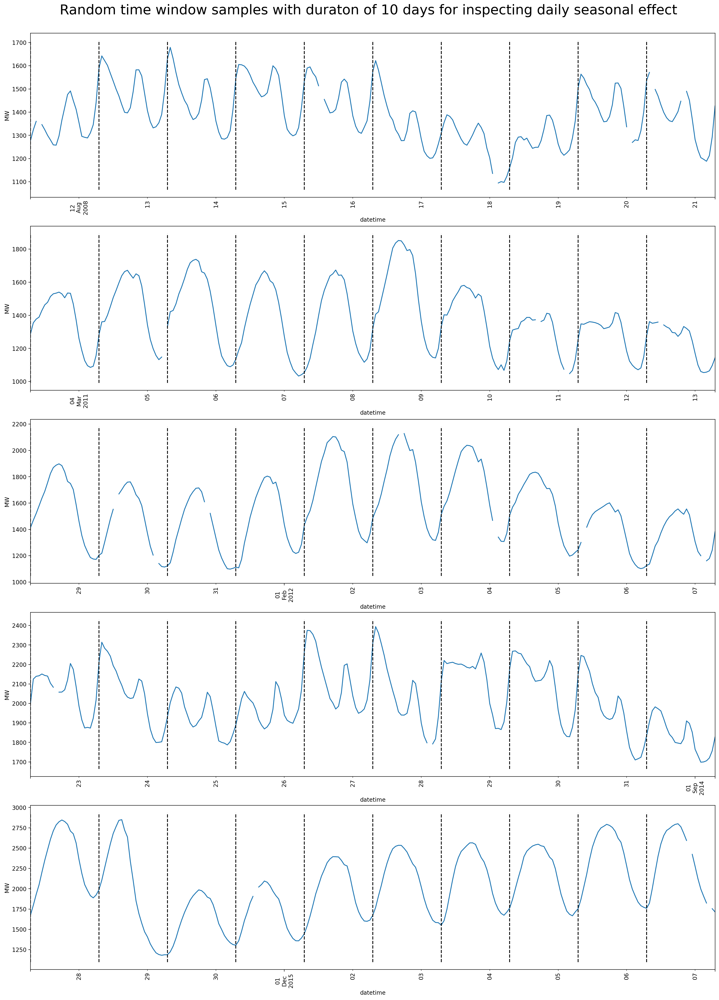

In [13]:
#drawing a random sample of 5 indices without repetition from sub sample, where current time is 07:00
sample = sorted([x for x in np.random.choice([x for x in train.index[:-241] if x.hour == 7],5,replace=False)])

#checking persistence of daily seasonality by inspecting 5 random time window of 10 days
f, axes = plt.subplots(len(sample),1,dpi=200,figsize=(18,24));
f.tight_layout(pad=3.0)
plt.suptitle('Random time window samples with duraton of 10 days for inspecting daily seasonal effect', y = 1.01, fontsize=24)

#plotting time windows and drawing vertical lines at 07:00 each day
for si,s in enumerate(sample):
    ids = train.index.to_list().index(s)
    idx = [train.iloc[x:x+1,:].index.values for x in range(ids, ids + 240,24)]
    train.iloc[ids:(ids+241),:].plot(ax=axes[si], legend=False, rot=90, ylabel='MW');
    axes[si].vlines(idx, axes[si].get_ylim()[0], axes[si].get_ylim()[1], colors='black', linestyles='dashed')

From the above chart we can clearly see that pattern repeats every day (i.e) every 24 hours and hence **daily seasonal effect is present**

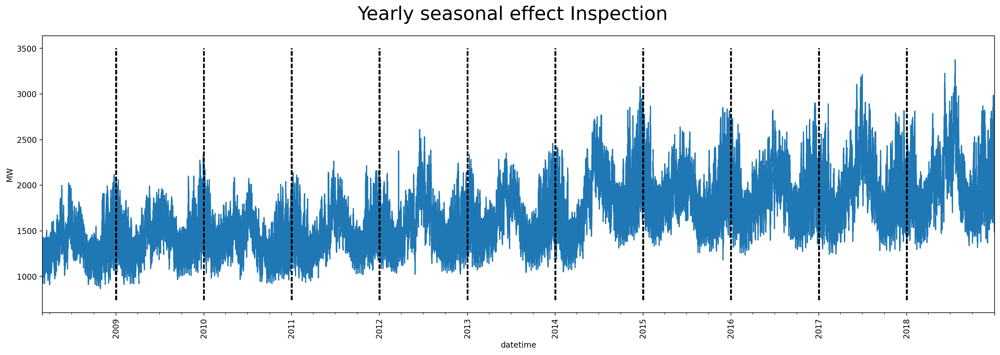

In [14]:
#checking presence of yearly seasonality
f, axes = plt.subplots(dpi=200,figsize=(18,6));
f.tight_layout(pad=3.0);
plt.suptitle('Yearly seasonal effect Inspection', y = 1.01, fontsize=24);

#plotting and drawing vertical lines at start of every year
idx = [train.loc[x:x+1*train.index.freq,:].index.values for x in train.index if x.dayofyear == 1]
train.plot(ax=axes, legend=False, rot=90, ylabel='MW');
axes.vlines(idx, axes.get_ylim()[0], axes.get_ylim()[1], colors='black', linestyles='dashed');

From the above chart we can clearly see that pattern repeats every year and hence **yearly seasonal effect is present**

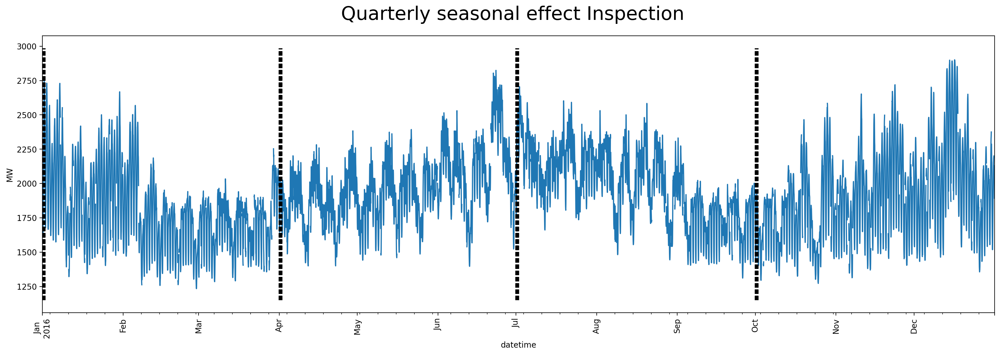

In [15]:
#checking presence of quarterly seasonality
train_filt = train[(train.index.year==2016) ]
f, axes = plt.subplots(dpi=200,figsize=(18,6));
f.tight_layout(pad=3.0);
plt.suptitle('Quarterly seasonal effect Inspection', y = 1.01, fontsize=24);

#plotting and drawing vertical lines at every start of quarter
idx = [train_filt.loc[x:x+1*train_filt.index.freq,:].index.values for x in train_filt.index
           if (x.day == 1) & (x.month in [1,4,7,10])]
train_filt.plot(ax=axes, legend=False, rot=90, ylabel='MW');
axes.vlines(idx, axes.get_ylim()[0], axes.get_ylim()[1], colors='black', linestyles='dashed');

From the above chart we can clearly see that different pattern for different quarter and hence **quarterly seasonal effect is not present**

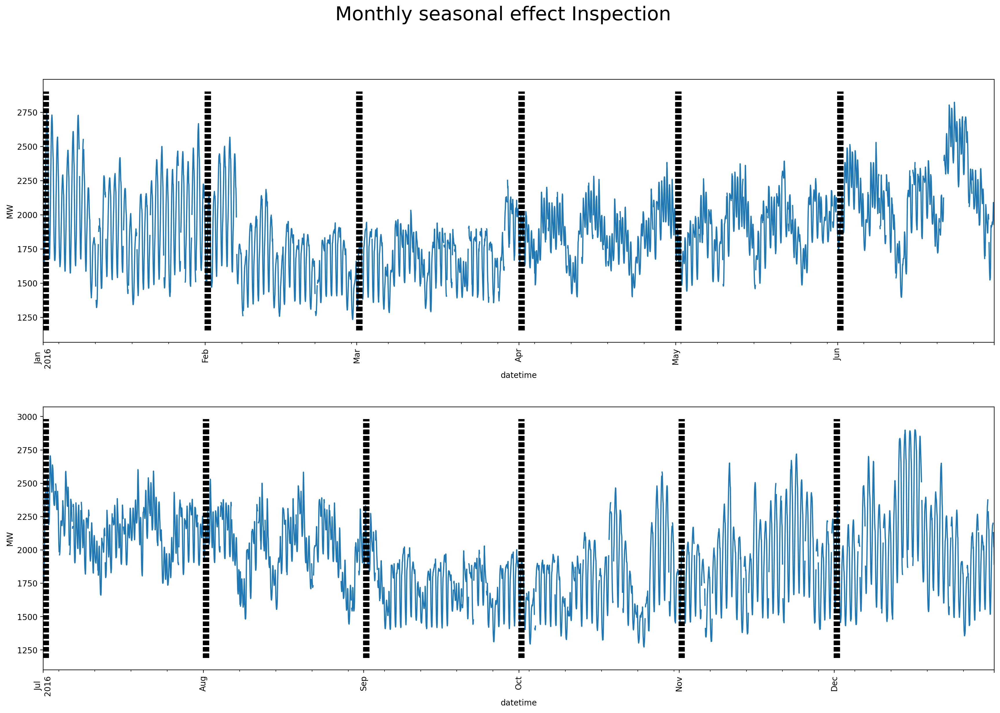

In [16]:
f, axes = plt.subplots(2,1,dpi=200,figsize=(18,12))
filt = [(train.index.month <=6) ,
        (train.index.month >6) ]
#checking presence of monthly seasonality
for i in range(2):
    train_filt = train[(train.index.year==2016) & filt[i]]
    f.tight_layout(pad=3.0);
    plt.suptitle('Monthly seasonal effect Inspection', y = 1.01, fontsize=24);

    #plotting and drawing vertical lines at every start of month
    idx = [train_filt.loc[x:x+1*train_filt.index.freq,:].index.values for x in train_filt.index
               if (x.day == 1)]
    train_filt.plot(ax=axes[i], legend=False, rot=90, ylabel='MW');
    axes[i].vlines(idx, axes[i].get_ylim()[0], axes[i].get_ylim()[1], colors='black', linestyles='dashed');

From the above chart we can clearly see that different pattern for different quarter and hence **monthly seasonal effect is not present**

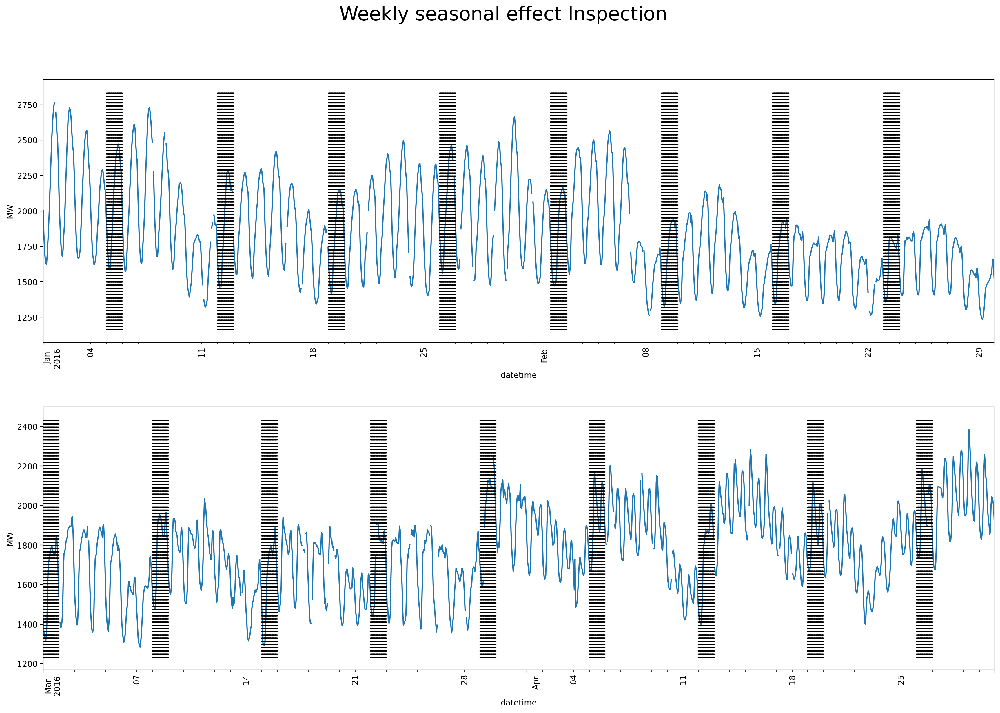

In [17]:
f, axes = plt.subplots(2,1,dpi=200,figsize=(18,12))
filt = [(train.index.month <=2) ,
        (train.index.month >2) & (train.index.month <=4) ]
#checking presence of weekly seasonality
for i in range(2):
    train_filt = train[(train.index.year==2016) & filt[i]]
    f.tight_layout(pad=3.0);
    plt.suptitle('Weekly seasonal effect Inspection', y = 1.01, fontsize=24);

    #plotting and drawing vertical lines at every start of week
    idx = [train_filt.loc[x:x+1*train_filt.index.freq,:].index.values for x in train_filt.index
               if (x.dayofweek == 1)]
    train_filt.plot(ax=axes[i], legend=False, rot=90, ylabel='MW')
    axes[i].vlines(idx, axes[i].get_ylim()[0], axes[i].get_ylim()[1], colors='black', linestyles='dotted');

From the above chart we can see that seasonality pattern exists for week where last 2 days (weekends) have lower energy consumption compared to other days.

Overall seasonalities that exist are :
    1. Daily 2. Yearly

In [18]:
train.fillna(method='ffill',inplace=True)

<a id='decompose'></a>
## 3. Decomposition of time series to individual components

In [20]:
#extracting daily seasonality from raw time series
sd_24 = sm.tsa.seasonal_decompose(train, period=24)

#extracting weekly seasonality from time series adjusted by daily seasonality
sd_168 = sm.tsa.seasonal_decompose(train - np.array(sd_24.seasonal).reshape(-1,1), period=168)

#extracting yearly seasonality from time series adjusted by daily and weekly seasonality
sd_8766 = sm.tsa.seasonal_decompose(train - np.array(sd_168.seasonal).reshape(-1,1), period=8766)

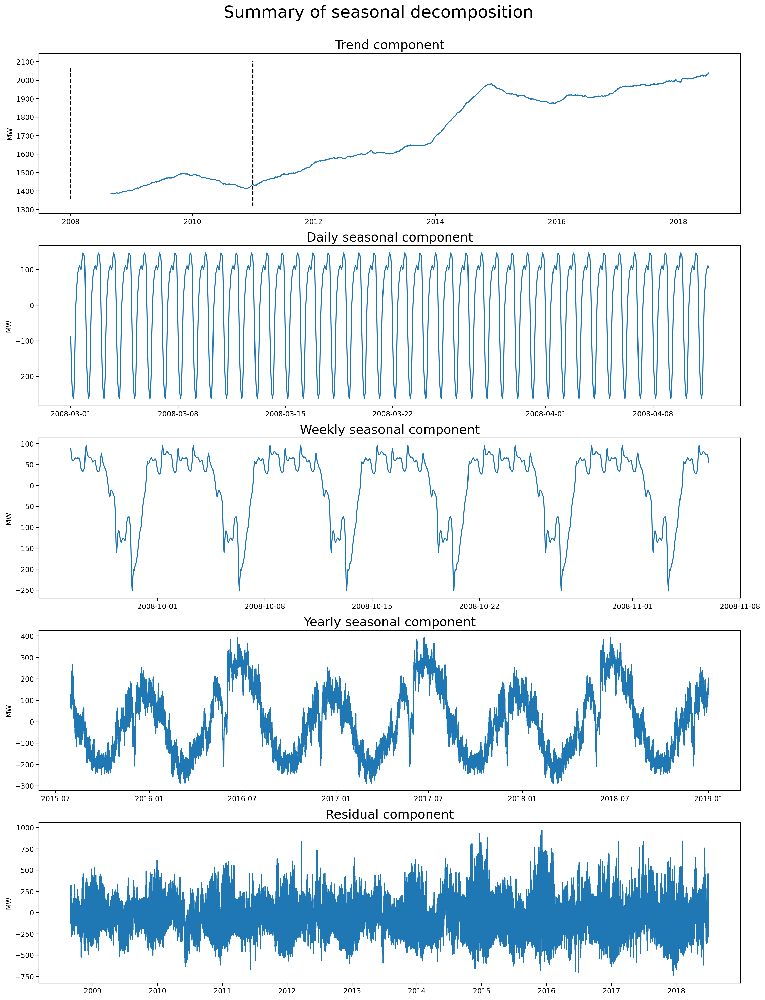

In [21]:
#drawing figure with subplots, predefined size and resolution
f, axes = plt.subplots(5,1,figsize=(18,24),dpi=200);

#setting figure title and adjusting title position and size
plt.suptitle('Summary of seasonal decomposition', y=0.92, fontsize=24);

#plotting trend component
axes[0].plot(sd_8766.trend)
axes[0].set_title('Trend component', fontdict={'fontsize': 18});

#drawing black dashed vertical lines between y axis limits
axes[0].vlines(datetime.datetime(2008,1,1), axes[0].get_ylim()[0], axes[0].get_ylim()[1], colors='black', linestyles='dashed');
axes[0].vlines(datetime.datetime(2011,1,1), axes[0].get_ylim()[0], axes[0].get_ylim()[1], colors='black', linestyles='dashed');

#plotting daily seasonal component
axes[1].plot(sd_24.seasonal[:1000]);
axes[1].set_title('Daily seasonal component', fontdict={'fontsize': 18});

#plotting weekly seasonal component
axes[2].plot(sd_168.seasonal[5000:6000]);
axes[2].set_title('Weekly seasonal component', fontdict={'fontsize': 18});

#plotting yearly seasonality
axes[3].plot(sd_8766.seasonal[-30000:]);
axes[3].set_title('Yearly seasonal component', fontdict={'fontsize': 18});

#plotting residual of decomposition
axes[4].plot(sd_8766.resid);
axes[4].set_title('Residual component', fontdict={'fontsize': 18});

#setting label for each y axis
for a in axes:
    a.set_ylabel('MW');
    
plt.show();

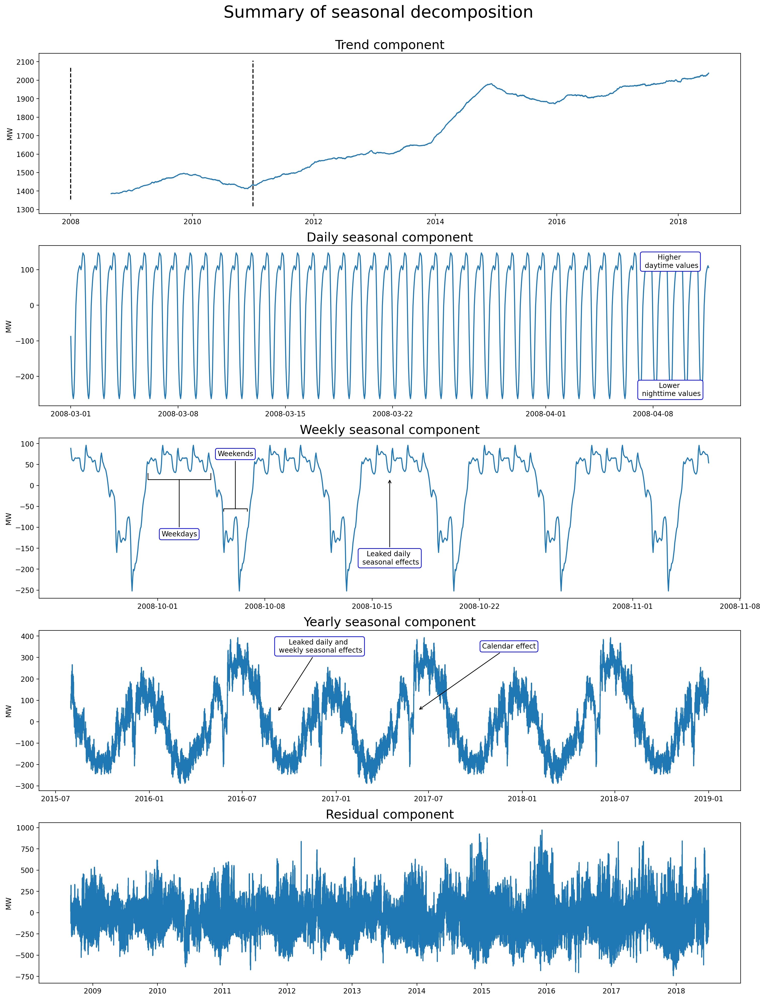

In [22]:
#drawing figure with subplots, predefined size and resolution
f, axes = plt.subplots(5,1,figsize=(18,24),dpi=200);

#setting figure title and adjusting title position and size
plt.suptitle('Summary of seasonal decomposition', y=0.92, fontsize=24);

#plotting trend component
axes[0].plot(sd_8766.trend)
axes[0].set_title('Trend component', fontdict={'fontsize': 18});

#drawing black dashed vertical lines between y axis limits
axes[0].vlines(datetime.datetime(2008,1,1), axes[0].get_ylim()[0], axes[0].get_ylim()[1], colors='black', linestyles='dashed');
axes[0].vlines(datetime.datetime(2011,1,1), axes[0].get_ylim()[0], axes[0].get_ylim()[1], colors='black', linestyles='dashed');

#plotting daily seasonal component
axes[1].plot(sd_24.seasonal[:1000]);
axes[1].set_title('Daily seasonal component', fontdict={'fontsize': 18});
axes[1].annotate('Higher \n daytime values', xy=(0.54, 0.50),
            xycoords='axes fraction',
            va='center', ha='center',
            xytext=(0.9, 0.9),
            textcoords='axes fraction',
            bbox=dict(boxstyle='round', fc='w', ec='b'));
axes[1].annotate('Lower \n nighttime values', xy=(0.54, 0.50),
            xycoords='axes fraction',
            va='center', ha='center',
            xytext=(0.9, 0.1),
            textcoords='axes fraction',
            bbox=dict(boxstyle='round', fc='w', ec='b'));

#plotting weekly seasonal component
axes[2].plot(sd_168.seasonal[5000:6000]);
axes[2].set_title('Weekly seasonal component', fontdict={'fontsize': 18});

#placing comment in annotation with text box and arrow
axes[2].annotate('Leaked daily \n seasonal effects', xy=(0.50, 0.75),
            xycoords='axes fraction',
            va='center', ha='center',
            xytext=(0.50, 0.25),
            textcoords='axes fraction',
            bbox=dict(boxstyle='round', fc='w', ec='b'),
            arrowprops=dict(color='black',
                            arrowstyle='->',
                            connectionstyle='arc3'));
axes[2].annotate('Weekdays', xy=(0.20, 0.75),
            xycoords='axes fraction',
            va='center', ha='center',
            xytext=(0.20, 0.40),
            textcoords='axes fraction',
            bbox=dict(boxstyle='round', fc='w', ec='b'),
            arrowprops=dict(color='black',
                            arrowstyle='-[',
                            mutation_scale=45,
                            connectionstyle='arc3'));
axes[2].annotate('Weekends', xy=(0.28, 0.55),
            xycoords='axes fraction',
            va='center', ha='center',
            xytext=(0.28, 0.90),
            textcoords='axes fraction',
            bbox=dict(boxstyle='round', fc='w', ec='b'),
            arrowprops=dict(color='black',
                            arrowstyle='-[',
                            mutation_scale=17,
                            connectionstyle='arc3'));

#plotting yearly seasonality
axes[3].plot(sd_8766.seasonal[-30000:]);
axes[3].set_title('Yearly seasonal component', fontdict={'fontsize': 18});

#placing comments in annotations with text boxes and arrows
axes[3].annotate('Calendar effect', xy=(0.54, 0.50),
            xycoords='axes fraction',
            va='center', ha='center',
            xytext=(0.67, 0.9),
            textcoords='axes fraction',
            bbox=dict(boxstyle='round', fc='w', ec='b'),
            arrowprops=dict(color='black',
                            arrowstyle='->',
                            connectionstyle='arc3'));
axes[3].annotate('Leaked daily and \n weekly seasonal effects', xy=(0.34, 0.49),
            xycoords='axes fraction',
            va='center', ha='center',
            xytext=(0.40, 0.90),
            textcoords='axes fraction',
            bbox=dict(boxstyle='round', fc='w', ec='b'),
            arrowprops=dict(color='black',
                            arrowstyle='->',
                            connectionstyle='arc3'));

#plotting residual of decomposition
axes[4].plot(sd_8766.resid);
axes[4].set_title('Residual component', fontdict={'fontsize': 18});

#setting label for each y axis
for a in axes:
    a.set_ylabel('MW');
    
plt.show();

<a id='acf'></a>
## 3. ACF and PACF Plots

Create ACF and PACF plots using differenced non seasonal and seasonal data (in this case, just differencing on daily seasonal)

Create non-seasonal ACF / PACF 

/opt/saturncloud/envs/saturn/lib/python3.9/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


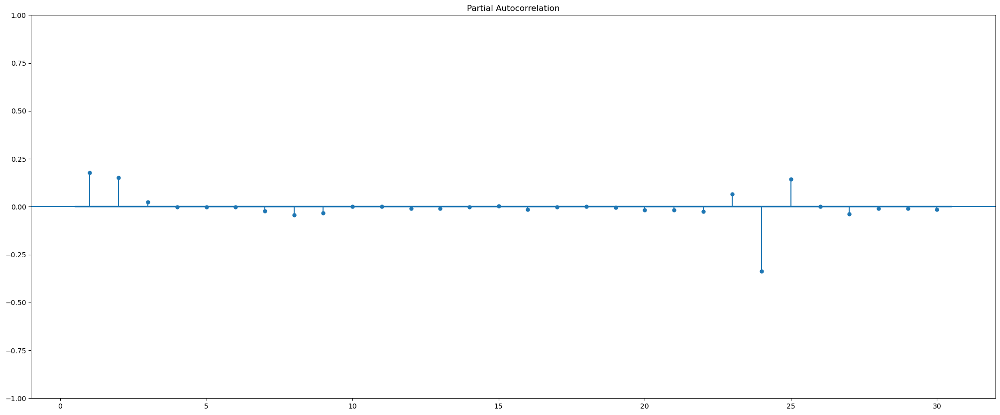

In [24]:
fig,ax=plt.subplots(figsize=(25,10))
plot_pacf(train['energy'].diff().diff(24).dropna(), ax=ax,lags = 30,zero=False) 
plt.show()

PACF plot, there are only 2 significant lags and this plot determines AR component of ARIMA model.So AR order (p) could be atmost 2. 

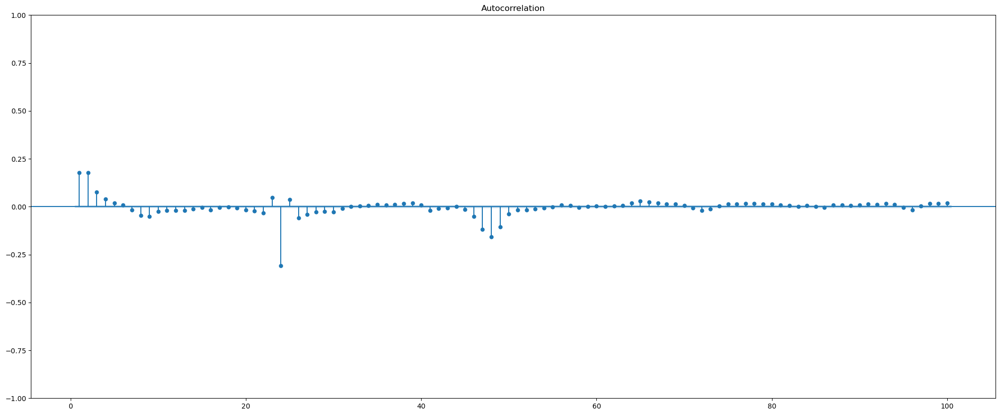

In [25]:
fig,ax=plt.subplots(figsize=(25,10))
plot_acf(train['energy'].diff().diff(24).dropna(), ax=ax,lags = 100,zero=False) 
plt.show()

Here ACF plot tails off while PACF plot cutsoff at certain point.
So the MA component would be zero (i.e q=0) and AR component would be 2 (p=2).

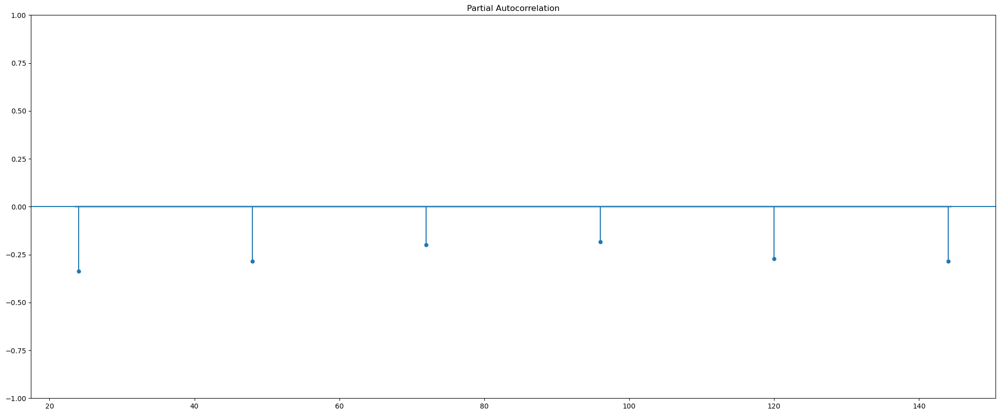

In [26]:
fig,ax=plt.subplots(figsize=(25,10))
plot_pacf(train['energy'].diff().diff(24).dropna(), ax=ax,lags = [24,48,72,96,120,144],zero=False) 
plt.show()

PACF plot, there are only 2 significant lags and this plot determines AR component of daily seasonal ARIMA model could be atmost 2. 

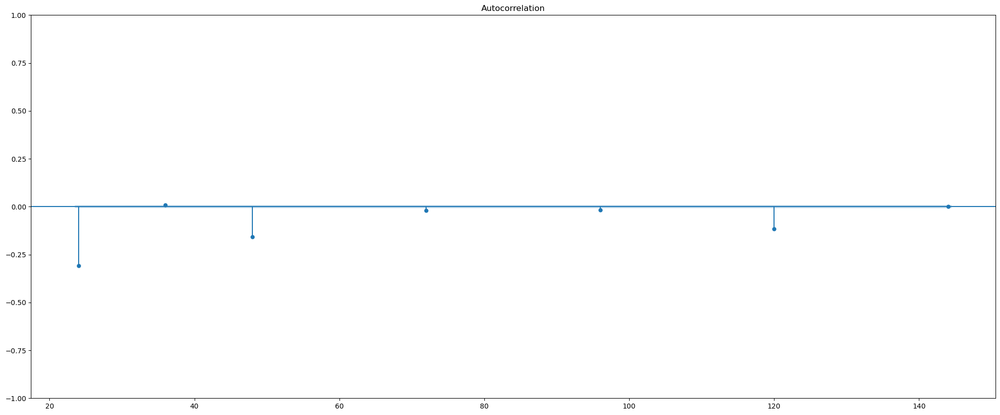

In [27]:
fig,ax=plt.subplots(figsize=(25,10))
plot_acf(train['energy'].diff().diff(24).dropna(), ax=ax,lags = [24,36,48,72,96,120,144],zero=False) 
plt.show()

ACF plot, there are only 2 significant lags and this plot determines MA component of daily seasonal ARIMA model could be atmost 2. 

Here both ACF and PACF cutsoff and so for daily seasonal ARIMA model maximum AR=2 and maximum MA=2